## Importing libraries

In [21]:
import numpy as np
from matplotlib import image
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter, gaussian_laplace
from scipy import signal
import cv2 as cv
import pandas as pd

## Loading image

In [22]:
img = image.imread('flowers.blur.png').astype(np.float64)

In [23]:
img.shape

(756, 1008, 3)

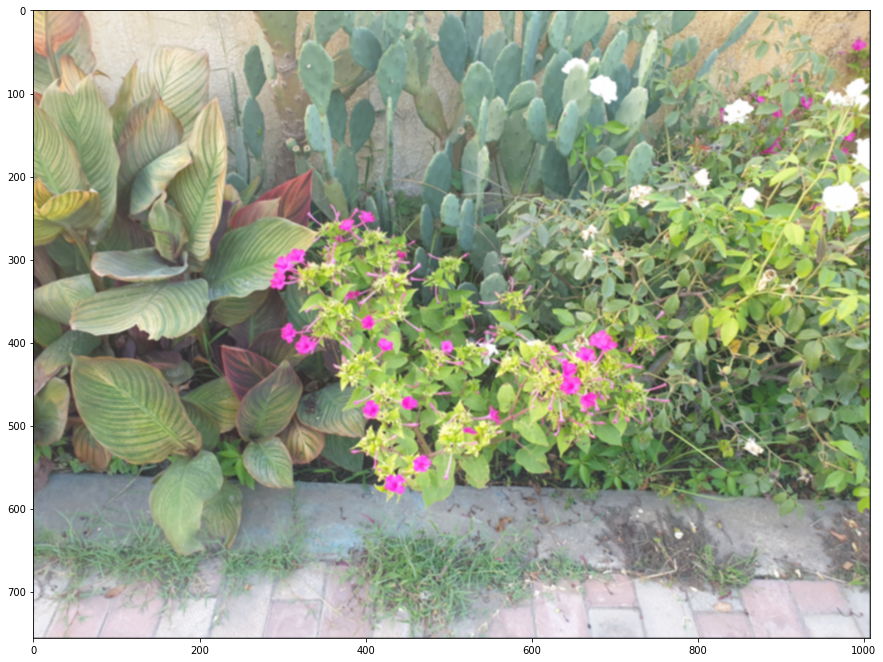

In [24]:
plt.figure(figsize=(15, 15))
plt.imshow(img);

### Utilities

In [25]:
def normalize_between_zero_to_one(arr):
    return (arr - arr.min()) / (arr.max() - arr.min())

def change_range_between_zero_to_one(arr):
    arr[arr > 1] = 1
    arr[arr < 0] = 0

    return arr

## Method 1

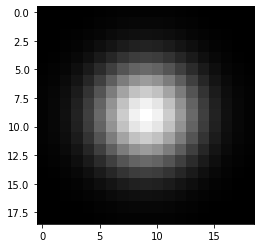

In [26]:
gauss_filter = np.zeros((19, 19))
gauss_filter[9, 9] = 1
gauss_filter = gaussian_filter(gauss_filter, sigma=3)

plt.imshow(gauss_filter, cmap='gray');

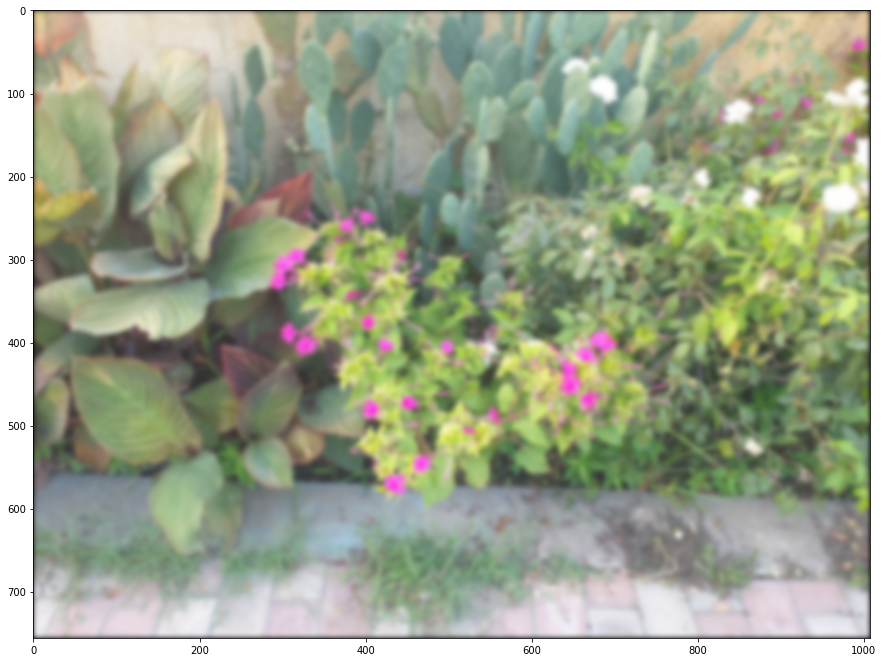

In [27]:
blurred_img = np.stack([signal.convolve2d(img[:, :, i], gauss_filter, mode='same') for i in range(3)], axis=-1)
blurred_img = change_range_between_zero_to_one(blurred_img)

plt.figure(figsize=(15, 15))
plt.imshow(blurred_img);

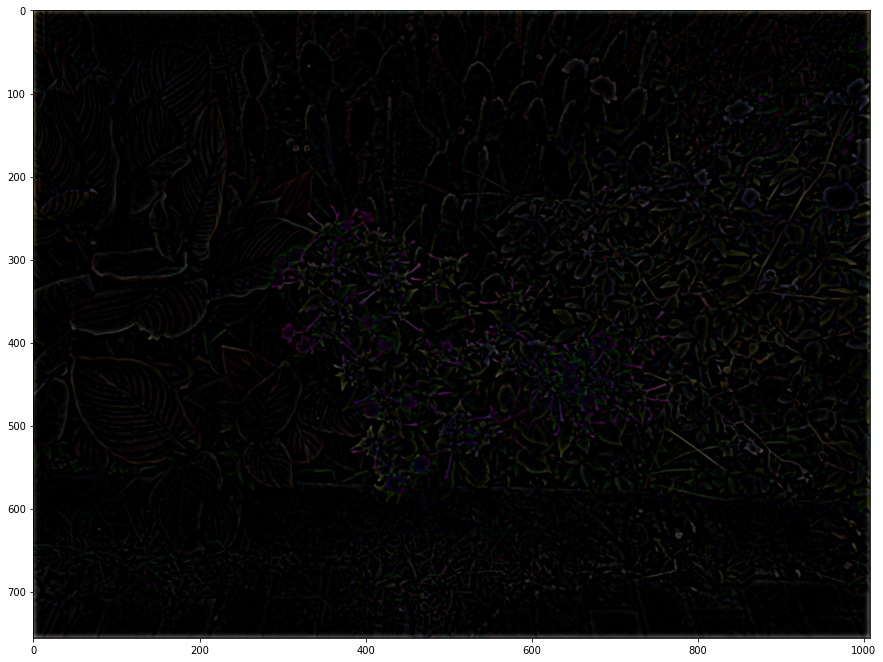

In [28]:
diff_img = change_range_between_zero_to_one(img - blurred_img)

plt.figure(figsize=(15, 15))
plt.imshow(diff_img);

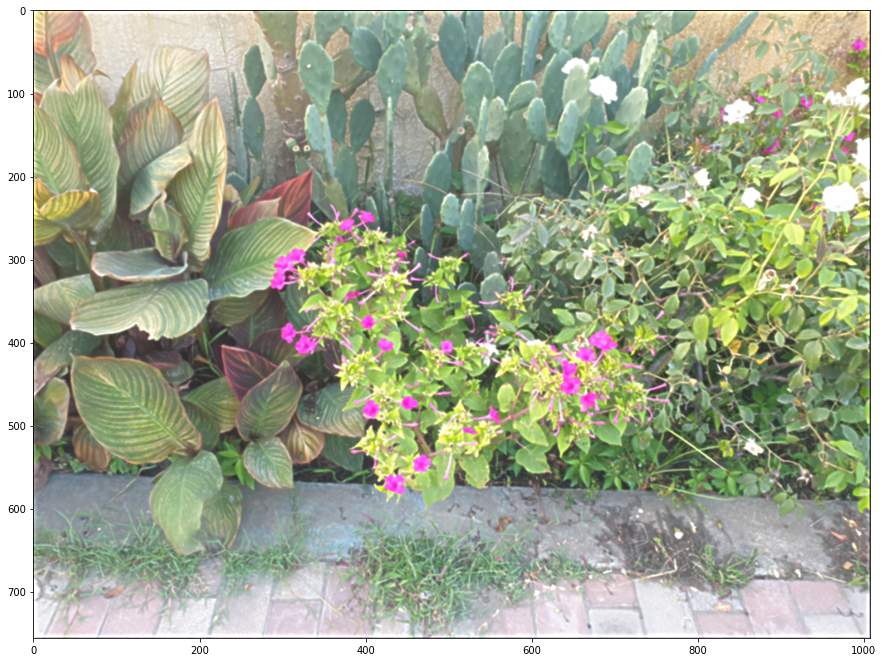

In [29]:
alpha = 1

res1 = img + alpha*(diff_img)
res1 = change_range_between_zero_to_one(res1)
plt.figure(figsize=(15, 15))
plt.imshow(res1);

## Method 2

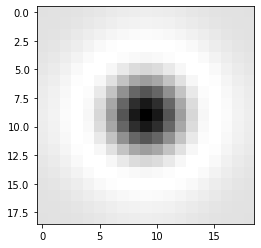

In [45]:
gauss_lap_filter = np.zeros((19, 19))
gauss_lap_filter[9, 9] = 1
gauss_lap_filter = gaussian_laplace(gauss_lap_filter, sigma=3)

plt.imshow(gauss_lap_filter, cmap='gray');

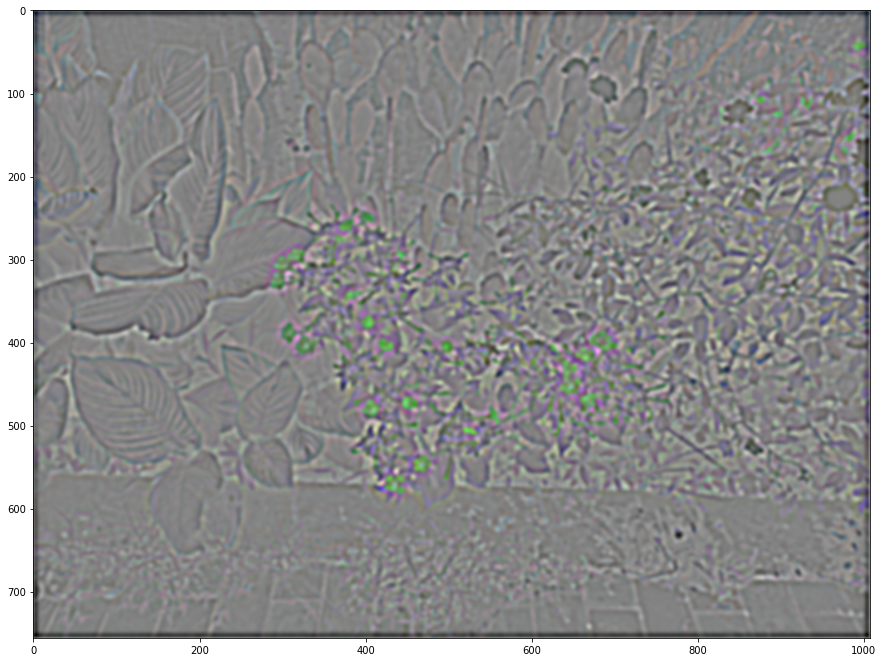

In [46]:
unsharp_mask = np.stack([signal.convolve2d(img[:, :, i], gauss_lap_filter, mode='same') for i in range(3)], axis=-1)
plt.figure(figsize=(15, 15))
plt.imshow(normalize_between_zero_to_one(unsharp_mask));

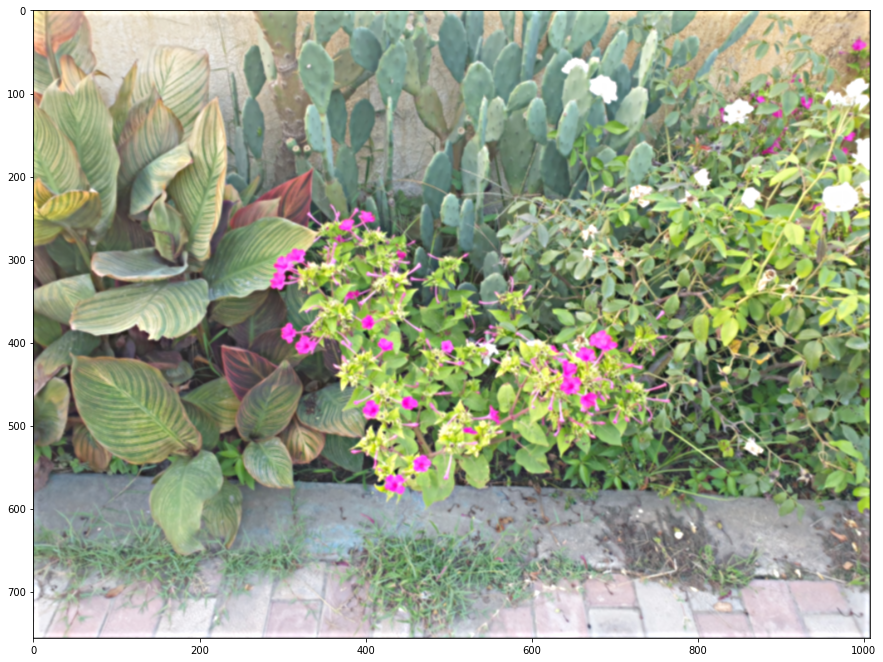

In [47]:
k = 5
res2 = img - k*unsharp_mask
res2 = change_range_between_zero_to_one(res2)

plt.figure(figsize=(15, 15))
plt.imshow(res2);

## Method 3

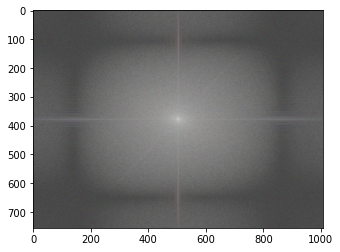

In [33]:
shifted_img = np.stack([np.fft.fftshift(np.fft.fft2(img[:, :, i])) for i in range(3)], axis=2)

ampiltude_img = np.abs(shifted_img)
log_amplitude_img = np.log(ampiltude_img)
plt.imshow(normalize_between_zero_to_one(log_amplitude_img));

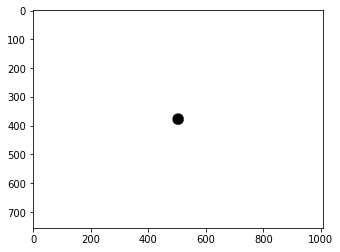

In [34]:
def HP_filter_generator(shape, radius=30):
    HP_filter = np.ones(shape)
    
    center_i, center_j = shape[0]//2, shape[1]//2
    for i in range(center_i-radius, center_i+radius):
        for j in range(center_j-radius, center_j+radius):
            if np.sqrt((i-center_i)**2 + (j-center_j)**2) <= radius:
                HP_filter[i, j] = 0
    
    return HP_filter
    

HP_filter = HP_filter_generator(shifted_img.shape[:2], 20)

plt.imshow(HP_filter, cmap='gray');

In [35]:
k = 0.4
F_res = np.stack([(1 + k*HP_filter)]*3, axis=2) * shifted_img
F_res.shape

(756, 1008, 3)

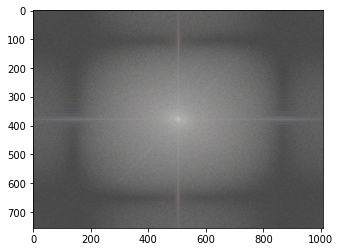

In [36]:
plt.imshow(normalize_between_zero_to_one(np.log(np.abs(F_res))), cmap='gray');

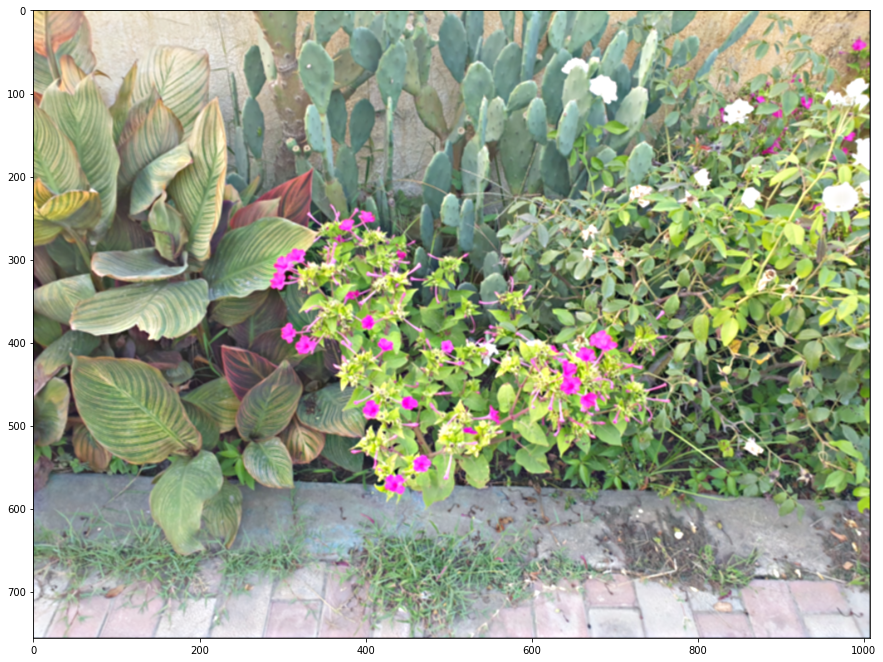

In [37]:
res3 = np.stack([np.real(np.fft.ifft2(np.fft.ifftshift(F_res[:, :, i]))) for i in range(3)], axis=2)

plt.figure(figsize=(15, 15))
plt.imshow(change_range_between_zero_to_one(res3));

## Method 4

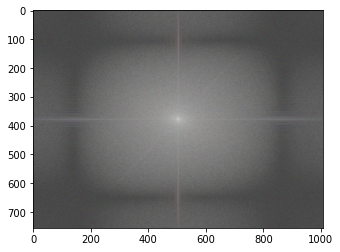

In [38]:
shifted_img = np.stack([np.fft.fftshift(np.fft.fft2(img[:, :, i])) for i in range(3)], axis=2)

ampiltude_img = np.abs(shifted_img)
log_amplitude_img = np.log(ampiltude_img)
plt.imshow(normalize_between_zero_to_one(log_amplitude_img));

In [39]:
center_i, center_j = shifted_img.shape[0]//2, shifted_img.shape[1]//2
for i in range(shifted_img.shape[0]):
    for j in range(shifted_img.shape[1]):
        shifted_img[i, j, :] = shifted_img[i, j, :] * (4 * np.pi**2 * ((i-center_i)**2 + (j-center_j)**2))

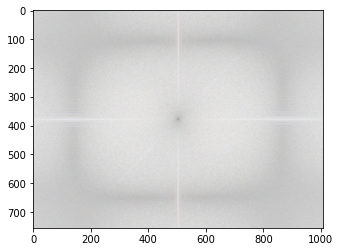

In [40]:
plt.imshow(normalize_between_zero_to_one(np.log(np.abs(shifted_img) + 1)));

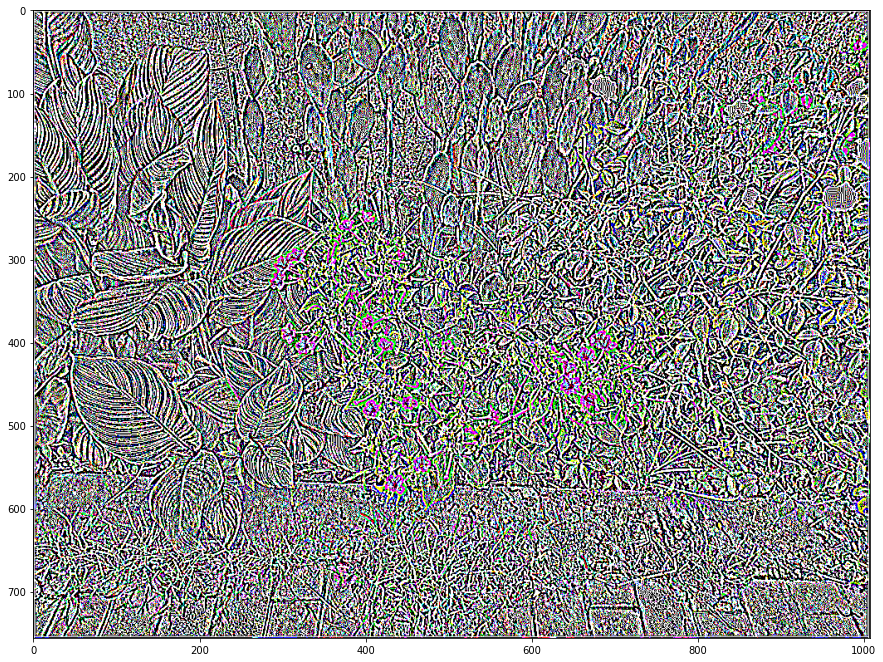

In [41]:
F_inv = np.stack([np.real(np.fft.ifft2(np.fft.ifftshift(shifted_img[:, :, i]))) for i in range(3)], axis=2)

plt.figure(figsize=(15, 15))
plt.imshow(change_range_between_zero_to_one(F_inv));

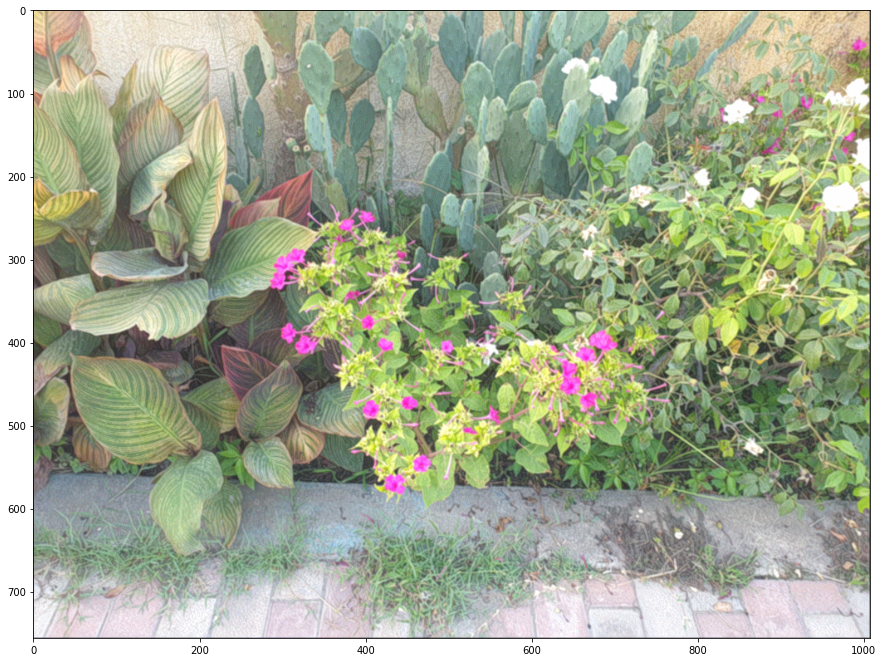

In [42]:
k = 5e-2
res4 = img + k*F_inv

plt.figure(figsize=(15, 15))
plt.imshow(change_range_between_zero_to_one(res4));

## Table of parameters

In [52]:
df = pd.DataFrame([[3, 1, 3, 5, 0.4, 0.05]], columns=['STD in A', 'Alpha in A', 'STD in B', 'K in B', 'K in C', 'K in D'])
df.style.hide_index()

STD in A,Alpha in A,STD in B,K in B,K in C,K in D
3,1,3,5,0.400000,0.050000
